Enter the value of K:100


100%|██████████| 10/10 [04:30<00:00, 27.07s/it]


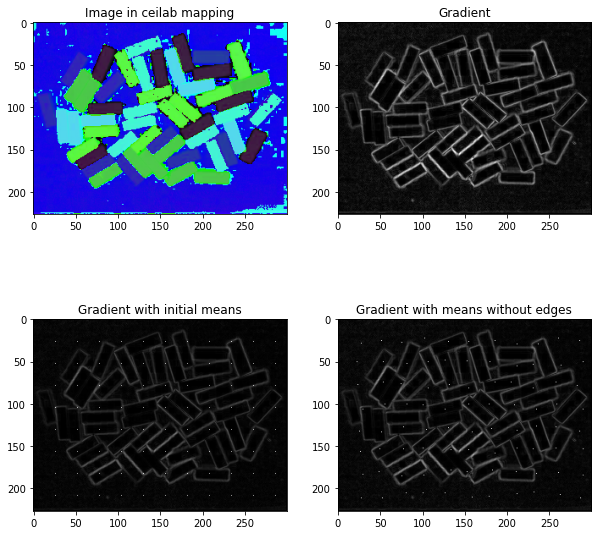

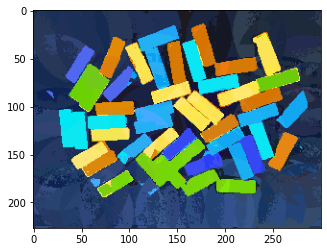

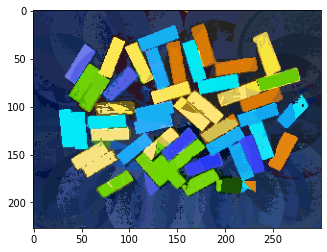

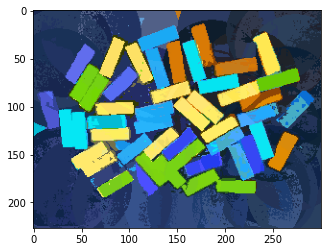

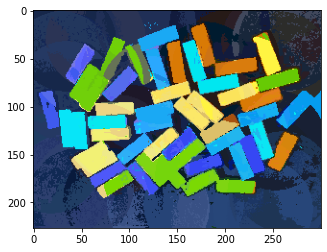

...

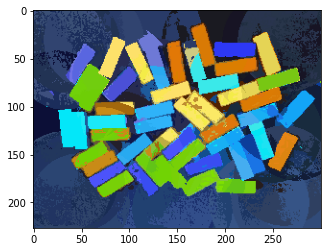

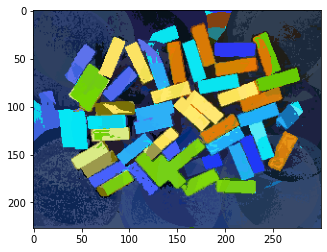

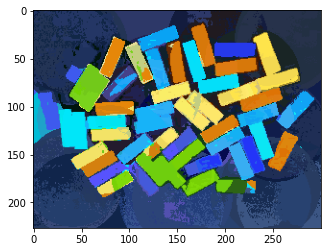

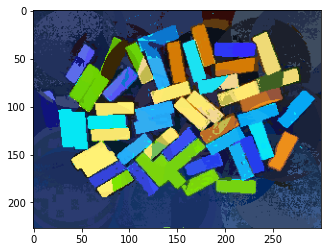

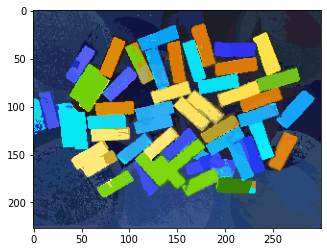

In [55]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import math
from skimage import color
from tqdm import tqdm
from PIL import Image
import PIL
from tkinter import *
from tkinter import messagebox
from PIL import ImageTk, Image
from tkinter import filedialog



img = cv2.imread('/content/test4.jpg',1)
img = cv2.resize(img,(int(img.shape[1]*0.5),int(img.shape[0]*0.5)),interpolation = cv2.INTER_AREA)
lab = color.rgb2lab(img)

N = img.shape[0]*img.shape[1]
K = int(input("Enter the value of K:"))
S = math.sqrt(N/K)

# Creating the grid with S as spacing
cod = []
frame = np.zeros((img.shape[0],img.shape[1]))
for x in range(int(S),img.shape[0],int(S)):
    for y in range(int(S),img.shape[1],int(S)):
        cod.append([x,y])
        frame[x,y] = 255

#Calculating the gradient image
grad = np.zeros((img.shape[0],img.shape[1]))
figure=plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.imshow(np.uint8(lab))
plt.title('Image in ceilab mapping')

for x in range(1,img.shape[0]-1):
    for y in range(1,img.shape[1]-1):
        X = []
        Y = []
        for i in range(3):
            xx = lab[x+1,y,i] - lab[x-1,y,i]
            yy = lab[x,y-1,i] - lab[x,y+1,i]
            X.append(xx)
            Y.append(yy)
        
        grad[x,y] = np.linalg.norm(X) + np.linalg.norm(Y)
plt.subplot(2,2,2)
plt.imshow(np.uint8(grad),cmap = 'gray')
plt.title('Gradient')
dst = cv2.addWeighted(grad, 0.4, frame, 0.6, 0.0)
plt.subplot(2,2,3)
plt.imshow(dst,cmap = 'gray')
plt.title('Gradient with initial means')
for i in range(len(cod)):
    pp = cod[i]
    q = grad[pp[0]-4:pp[0]+4,pp[1]-4:pp[1]+4]
    z = np.amin(q)
    result = np.where(q==z)
    t = list(zip(result[0],result[1]))[0]
    cod[i] = [pp[0]-4 + t[0],pp[1]-4 + t[1]]
    
frame2 = np.zeros((img.shape[0],img.shape[1]))

for loc in cod:
    x = loc[0]
    y = loc[1]
    frame2[x,y] = 255
dst2 = cv2.addWeighted(grad, 0.4, frame2, 0.6, 0.0)
plt.subplot(2,2,4)
plt.imshow(dst2,cmap = 'gray')
plt.title('Gradient with means without edges')

newImg = np.zeros(img.shape)
indexImg = np.zeros((img.shape[0],img.shape[1]))
for iters in tqdm(range(10)):
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):

            #Get the mean point with distance less than 2*S
            temp = []
            for i in range(len(cod)):
                dist = math.sqrt((x-cod[i][0])**2 + (y-cod[i][1])**2)
                if dist <= 2*S:
                    temp.append(cod[i])

            td = []
            for j in range(len(temp)):
                Dlab = math.sqrt((lab[:,:,0][x,y]-lab[:,:,0][temp[j][0],temp[j][1]])**2 + (lab[:,:,1][x,y]-lab[:,:,1][temp[j][0],temp[j][1]])**2 + (lab[:,:,2][x,y]-lab[:,:,2][temp[j][0],temp[j][1]])**2)
                Dxy  = math.sqrt((x-temp[j][0])**2 + (y-temp[j][1])**2)
                dist = Dlab - (20/S)*Dxy
                td.append(dist)
            if len(td)!=0:
                cord = temp[np.argmin(td)]
            
            newImg[x,y,0] = img[cord[0],cord[1],0]
            newImg[x,y,1] = img[cord[0],cord[1],1]
            newImg[x,y,2] = img[cord[0],cord[1],2]
            r = 0
            for item in cod:
                if list(item) == list(cord):
                    indexImg[x,y] = r
                r+=1

    for k in range(len(cod)):
        result1 = np.where(indexImg==k)
        if len(result1[0])!=0:
            cod[k] = np.array([int(np.mean(result1[0])),int(np.mean(result1[1]))])

    frame1 = np.zeros((img.shape[0],img.shape[1]))
    for l in range(len(cod)):
        frame1[cod[l][0],cod[l][1]] = 255
    plt.figure()
    plt.imshow(np.uint8(newImg))
    j = Image.fromarray(np.uint8(newImg), mode='RGB')
    j.save(str(iters)+'.jpg')


    

# **ĐOẠN CODE SO SÁNH K_MEANS VÀ SLIC TRÊN RGB**

# Superpixel Clustering using SLIC (Simple Linear Iterarive Clustering).
<!-- Understanding and implementing SLIC Superpixels. -->
Một siêu pixel có thể được định nghĩa là một nhóm các pixel có chung các đặc điểm. Phân cụm lặp tuyến tính đơn giản (SLIC) tạo ra các siêu pixel bằng cách phân cụm các pixel dựa trên độ tương đồng về màu sắc và độ gần nhau của chúng trong mặt phẳng hình ảnh. Mục đích của nhiệm vụ này là để hiểu và triển khai SLIC Superpixels.


Trước tiên hãy tải xuống tập dữ liệu.

In [ ]:
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip

--2023-01-09 12:55:34--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 96.17.188.215, 2600:1417:76:68e::317f, 2600:1417:76:68c::317f
Connecting to download.microsoft.com (download.microsoft.com)|96.17.188.215|:80... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip [following]
--2023-01-09 12:55:34--  https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Connecting to download.microsoft.com (download.microsoft.com)|96.17.188.215|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M  19.

In [ ]:
!unzip --qq msrc_objcategimagedatabase_v1.zip

Chúng tôi chỉ tập trung vào sáu hình ảnh trong nhiệm vụ này.


In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

In [ ]:
#All important functions to plot, do not modify this block
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im,title,xticks=[],yticks= [],isCv2 = True):
    """
    im :Image to plot
    title : Title of image 
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing 
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm), 
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value  
    
    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot 
    
    Output: None
    Creates a plot    
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]
    
    plot_image(seg_img,title)
    
    return    

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust} 
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot: 
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the 
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

Hãy xem sáu hình ảnh đó là gì:

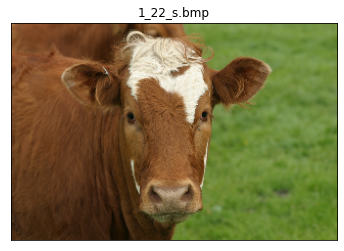

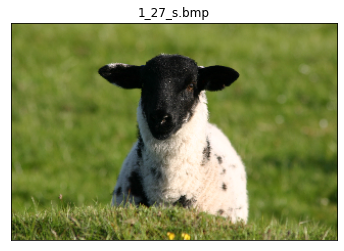

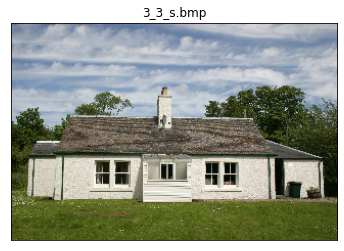

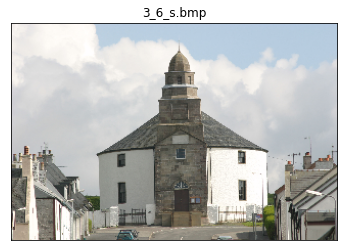

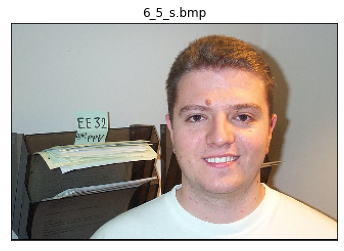

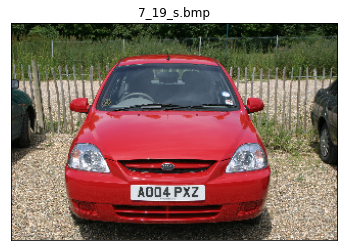

In [ ]:
for i in im_list:
    plot_image(cv2.imread(i),i.split("/")[-1])

### K-means on RGB
Chúng ta biết thuật toán phân cụm k-mean. Đây là một thuật toán không được giám sát giúp giảm thiểu khoảng cách__L2norm/Euclidean theo cách sao cho nó tối đa hóa độ tương tự trong cụm và giảm thiểu độ tương tự giữa các cụm.__

Hoàn thành chức năng phân cụm pixel. Nó sẽ nhập một hình ảnh (dim = (n $\times$ m $\times$ 3)) và số cụm cần thiết.
K có nghĩa là phân cụm hoạt động trên các pixel hình ảnh không?
Đặt số cụm là K = 5, 10, 50

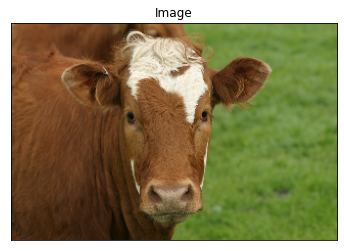

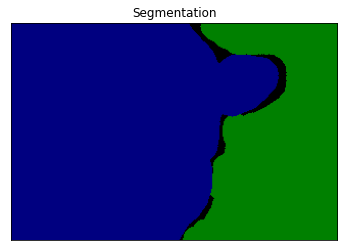

In [ ]:
im = cv2.imread(im_list[0])
seg = cv2.imread(im_list[0].replace("_s","_s_GT"))

plot_image(im,"Image")
plot_image(seg,"Segmentation")


In [ ]:
import math
class Cluster:
    def __init__(self, color_center, xy_center):
        self.color_center = color_center
        self.xy_center = xy_center
        self.center = np.append(color_center, xy_center)
        self.points = []

        
class Pixel:
    def __init__(self, color, pos):
        self.color = color
        self.pos = pos

In [ ]:
def distance(p1, p2):
    return np.linalg.norm(p1-p2)


def weighted_distance(p1, p2, clr_wt, pos_wt):
    color_dist = distance(p1.color, p2.color)
    xy_dist = distance(p1.pos, p2.pos)
    
    dist = (clr_wt * color_dist**2 + pos_wt * xy_dist**2)**0.5
    return dist


'''
This function gives us the index of the nearest cluster in the RGBXY space :
For naive K-Means i.e for 3D RGB vector spapce:  clr_wt=1, pos_wt=0 - So we are not taking into account the xy distance
For K-Means with 5D vector space - RGBXY space: clr_wt=1, pos_wt=1 - We are giving equal weightage to RGB and XY vector spaces
For Weighted K-Means with 5D vector space we can vary the values of clr_wt and pos_wt as per the values of lambda1 and lambda2 passed in the function

This way We have made a generic K-Means algorithm in terms of the distance metric 
'''

def get_closest_cluster_ind(im, pixel, clusters, cluster_vec_list, clr_wt, pos_wt):
    min_dist = math.inf
    min_ind = 0

    pix_vec = np.append(pixel.color, pixel.pos)

    diff = cluster_vec_list - pix_vec  #finding the difference between the vectors collectively
    
    color_norm = np.linalg.norm(diff[:, :3], axis=1)  # separating the RGB and XY vector spaces
    xy_norm = np.linalg.norm(diff[:, 3:], axis=1)


    wt_color_dist = clr_wt*color_norm**2   # weighted distance 
    wt_xy_dist = pos_wt*xy_norm**2
    total_dist = (wt_color_dist + wt_xy_dist)**0.5

    min_ind = np.argmin(total_dist)
    return min_ind



def assign_clusters(im, seg_map, clusters, cluster_vec_list, clr_wt, pos_wt):
    h = im.shape[0]
    w = im.shape[1]
    for i in range(h):
        for j in range(w):
            pixel_color = im[i,j]
            curr_pixel = Pixel(pixel_color, np.array([i,j]))
            
            closest_cluster_ind = get_closest_cluster_ind(im, curr_pixel, clusters, cluster_vec_list, clr_wt, pos_wt)
            
            pix_vec = np.append(pixel_color, [i,j])
            clusters[closest_cluster_ind].points.append(pix_vec)
            
            seg_map[i,j] = closest_cluster_ind + 1


In [ ]:
def get_init_centroids(im, num_centroids, loc_req=False):
    cluster_list = []
    cluster_vec_list = []
    for i in range(num_centroids):
        point = (np.random.randint(0, im.shape[0]), np.random.randint(0, im.shape[1]))
        pixel = im[point]
        cluster = Cluster(pixel, np.array(point))
        cluster_list.append(cluster)
        cluster_vec_list.append(np.append(pixel, point))

    return cluster_list, np.array(cluster_vec_list)

In [ ]:
def adjust_cluster_centroids(clusters, cluster_vec_list):
    for i, cluster in enumerate(clusters):
        points = cluster.points
        if len(points) > 0:
            mean_val = np.mean(points, axis=0)
            cluster.color_center = mean_val[:3]  # mean value in RGB space
            cluster.xy_center = mean_val[3:]  # mean value in XY space
            cluster.center = mean_val        
            cluster_vec_list[i] = mean_val  
            cluster.points = []


def is_converged(new_cluster_centers, old_cluster_centers, threshold=5):
    if len(new_cluster_centers) == 0 or len(old_cluster_centers) == 0:
        return False 
    #'''
    new_cluster_centers = np.array(new_cluster_centers)
    old_cluster_centers = np.array(old_cluster_centers)
    shift = np.linalg.norm(new_cluster_centers - old_cluster_centers, axis=1).sum()
    return shift <= threshold
    #'''
    #return False
        

In [ ]:
def kmeans(im, k, clr_wt, pos_wt, num_iteration=10):
    
    cluster_centers = []
    old_cluster_centers = []
    seg_map = -1 * np.ones((im.shape[0], im.shape[1]))
    
    clusters, cluster_vec_list = get_init_centroids(im, num_centroids=k)
    itr = 0
    while not is_converged(cluster_centers, old_cluster_centers) and itr < num_iteration:
        old_cluster_centers = []#[c.center for c in clusters]
        
        assign_clusters(im, seg_map, clusters, cluster_vec_list, clr_wt=clr_wt, pos_wt=pos_wt)
        adjust_cluster_centroids(clusters, cluster_vec_list)
        
        new_cluster_centers = []#[c.center for c in clusters]
        
        itr += 1
        print('===========<< Clusters: ', k, ': Iteration: ', itr, ' complete >>===========')
        
    return seg_map

===========<< Clusters:  5 : Iteration:  1  complete >>===========
===========<< Clusters:  5 : Iteration:  2  complete >>===========
===========<< Clusters:  5 : Iteration:  3  complete >>===========
===========<< Clusters:  5 : Iteration:  4  complete >>===========
===========<< Clusters:  5 : Iteration:  5  complete >>===========
===========<< Clusters:  5 : Iteration:  6  complete >>===========
===========<< Clusters:  5 : Iteration:  7  complete >>===========
===========<< Clusters:  5 : Iteration:  8  complete >>===========
===========<< Clusters:  5 : Iteration:  9  complete >>===========
===========<< Clusters:  5 : Iteration:  10  complete >>===========
===========<< Clusters:  10 : Iteration:  1  complete >>===========
===========<< Clusters:  10 : Iteration:  2  complete >>===========
===========<< Clusters:  10 : Iteration:  3  complete >>===========
===========<< Clusters:  10 : Iteration:  4  complete >>===========
===========<< Clusters:  10 : Iteration:  5  complete >>=

<ipython-input-10-08d44db55f94>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


===========<< Clusters:  50 : Iteration:  1  complete >>===========
===========<< Clusters:  50 : Iteration:  2  complete >>===========
===========<< Clusters:  50 : Iteration:  3  complete >>===========
===========<< Clusters:  50 : Iteration:  4  complete >>===========
===========<< Clusters:  50 : Iteration:  5  complete >>===========
===========<< Clusters:  50 : Iteration:  6  complete >>===========
===========<< Clusters:  50 : Iteration:  7  complete >>===========
===========<< Clusters:  50 : Iteration:  8  complete >>===========
===========<< Clusters:  50 : Iteration:  9  complete >>===========
===========<< Clusters:  50 : Iteration:  10  complete >>===========
===========<< Clusters:  5 : Iteration:  1  complete >>===========
===========<< Clusters:  5 : Iteration:  2  complete >>===========
===========<< Clusters:  5 : Iteration:  3  complete >>===========
===========<< Clusters:  5 : Iteration:  4  complete >>===========
===========<< Clusters:  5 : Iteration:  5  complet

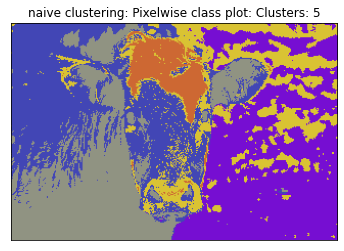

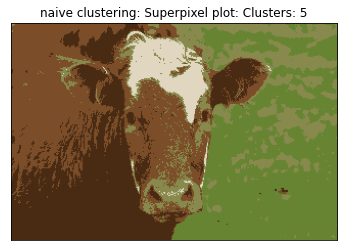

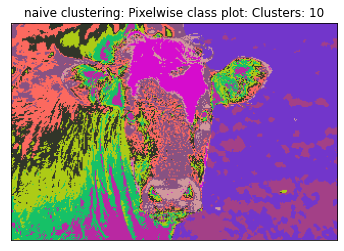

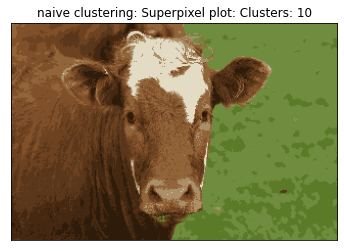

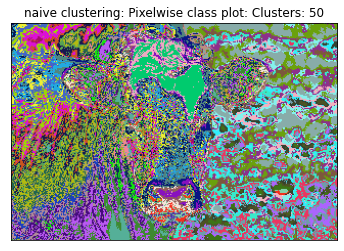

...

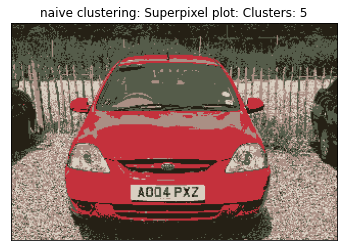

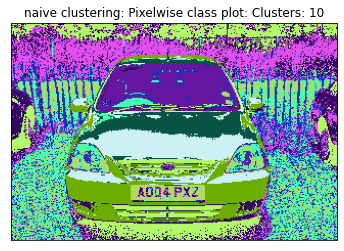

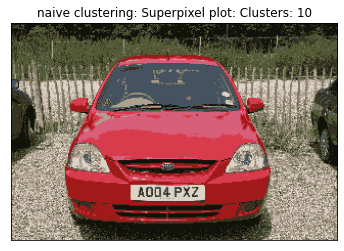

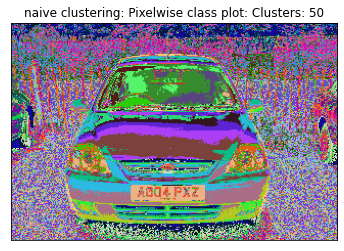

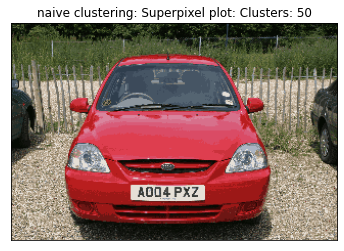

In [ ]:
from sklearn.cluster import KMeans
import numpy as  np
def cluster_pixels(im,k):    
    #TODO Pixelwise clustering   

    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel
    segmap = kmeans(im, k, clr_wt=1, pos_wt=0)

    return segmap


for im_name in im_list:
  im = cv2.imread(im_name)
  for k in [5,10,50]:
      clusters = cluster_pixels(im,k)
      _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
      superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

###Câu hỏi 2: Bây giờ bạn đã có một chức năng tiện dụng, chúng tôi có một nhiệm vụ hơi phức tạp

Thay vì chạy phân cụm trên không gian RGB, hãy chạy phân cụm trên không gian RGBXY. Điều đó mang lại cho chúng ta những lợi thế gì?
(thử với cụm = 5, 10, 25, 50, 150)


===========<< Clusters:  20 : Iteration:  1  complete >>===========
===========<< Clusters:  20 : Iteration:  2  complete >>===========
===========<< Clusters:  20 : Iteration:  3  complete >>===========
===========<< Clusters:  20 : Iteration:  4  complete >>===========
===========<< Clusters:  20 : Iteration:  5  complete >>===========
===========<< Clusters:  20 : Iteration:  6  complete >>===========
===========<< Clusters:  20 : Iteration:  7  complete >>===========
===========<< Clusters:  20 : Iteration:  8  complete >>===========
===========<< Clusters:  20 : Iteration:  9  complete >>===========
===========<< Clusters:  20 : Iteration:  10  complete >>===========
===========<< Clusters:  80 : Iteration:  1  complete >>===========
===========<< Clusters:  80 : Iteration:  2  complete >>===========
===========<< Clusters:  80 : Iteration:  3  complete >>===========
===========<< Clusters:  80 : Iteration:  4  complete >>===========
===========<< Clusters:  80 : Iteration:  5  co

<ipython-input-10-08d44db55f94>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


===========<< Clusters:  80 : Iteration:  1  complete >>===========
===========<< Clusters:  80 : Iteration:  2  complete >>===========
===========<< Clusters:  80 : Iteration:  3  complete >>===========
===========<< Clusters:  80 : Iteration:  4  complete >>===========
===========<< Clusters:  80 : Iteration:  5  complete >>===========
===========<< Clusters:  80 : Iteration:  6  complete >>===========
===========<< Clusters:  80 : Iteration:  7  complete >>===========
===========<< Clusters:  80 : Iteration:  8  complete >>===========
===========<< Clusters:  80 : Iteration:  9  complete >>===========
===========<< Clusters:  80 : Iteration:  10  complete >>===========
===========<< Clusters:  200 : Iteration:  1  complete >>===========
===========<< Clusters:  200 : Iteration:  2  complete >>===========
===========<< Clusters:  200 : Iteration:  3  complete >>===========
===========<< Clusters:  200 : Iteration:  4  complete >>===========
===========<< Clusters:  200 : Iteration:  

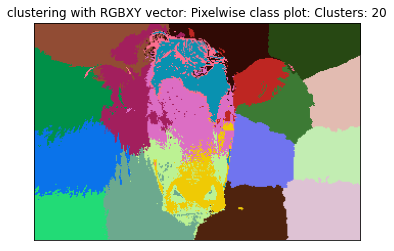

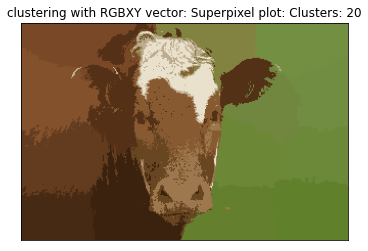

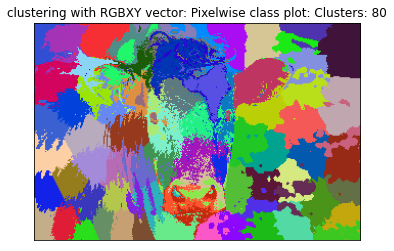

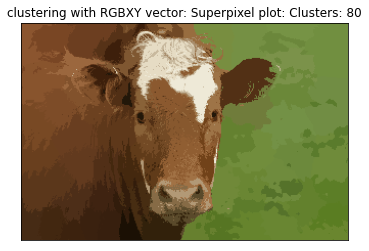

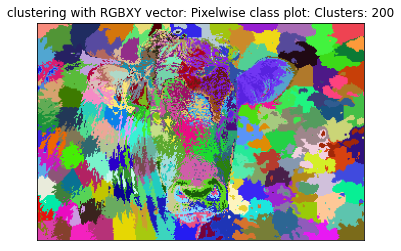

...

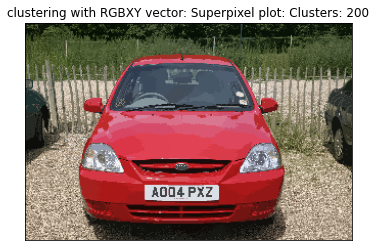

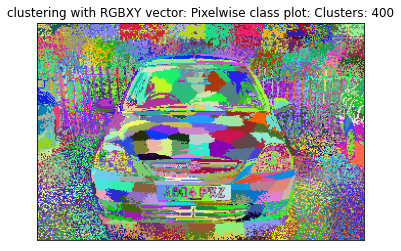

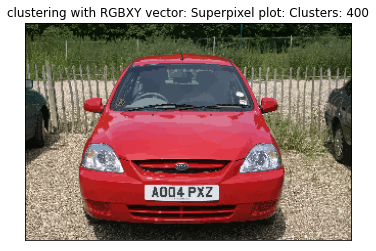

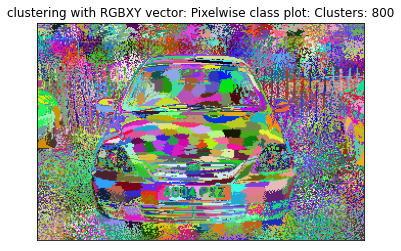

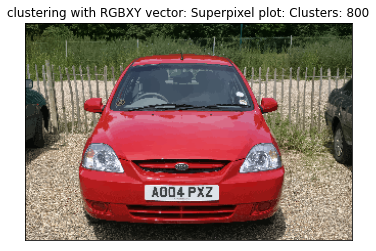

In [ ]:
#TODO: clustering r,b,g,x,y values 
#try k = 20,80,200,400,800

def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    #assert 1==2,"NOT IMPLEMENTED"
    # giving equal weight to the position of the pixels too 
    segmap = kmeans(im, k, clr_wt=1, pos_wt=1, num_iteration=10)
    return segmap



for im_name in im_list:
  im = cv2.imread(im_name)
  for k in [20,80,200,400,800]:
      clusters = cluster_rgbxy(im,k)
      
      _ = rgb_segment(clusters,n = k, title =  "clustering with RGBXY vector: Pixelwise class plot: Clusters: " + str(k),legend = False)
      superpixel_plot(im,clusters,title =  "clustering with RGBXY vector: Superpixel plot: Clusters: "+ str(k))
  print('Clustering done for image')

### Phương tiện k đã sửa đổi với khoảng cách có trọng số.

  Đặt $cluster\_center_i$ đại diện cho $i^{th}$ trung tâm cụm, $cluster\_center_i^{rgb}$ biểu thị giá trị RGB và $cluster\_center_i^{xy}$ lần lượt là tọa độ tương ứng của pixel trung tâm .
 
  Đặt $x_{rgb}$ là giá trị RGB của pixel và đặt $x_{xy}$ là tọa độ của pixel tương ứng.
  <!-- Đặt $x_{xy}$ là tọa độ của $x_{rgb}$ -->

$ distance(x_{rgb},x_{xy}) = \lambda_1 * euclidean(x_{rgb},cluster\_center_{i}^{rgb}) + \lambda_2 * euclidean(x_{xy},cluster\_center_{ i}^{xy})$



Tìm giá trị tốt cho siêu đường kính $\lambda_1$ và $\lambda_2$ (thử trên 250 cụm)

===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
===========<< Clusters:  250 : Iteration:  5  complete >>===========
===========<< Clusters:  250 : Iteration:  6  complete >>===========
===========<< Clusters:  250 : Iteration:  7  complete >>===========
===========<< Clusters:  250 : Iteration:  8  complete >>===========
===========<< Clusters:  250 : Iteration:  9  complete >>===========
===========<< Clusters:  250 : Iteration:  10  complete >>===========
Clustering done for image: 1
===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
====

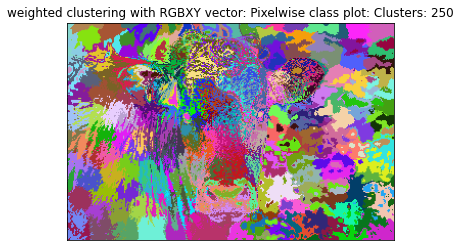

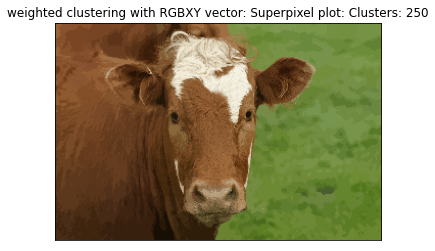

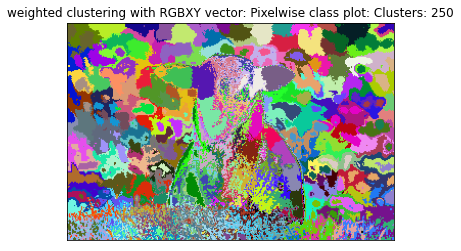

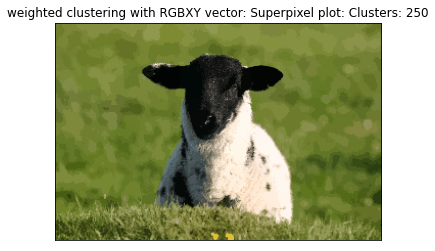

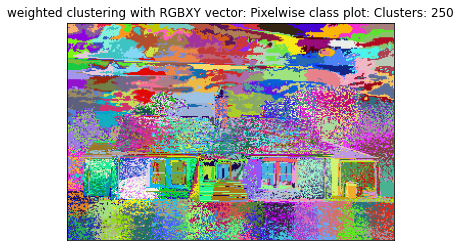

...

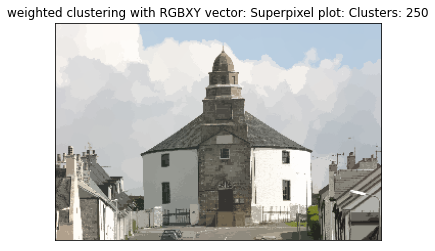

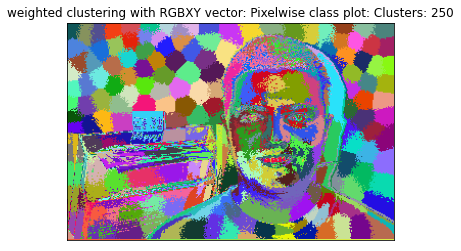

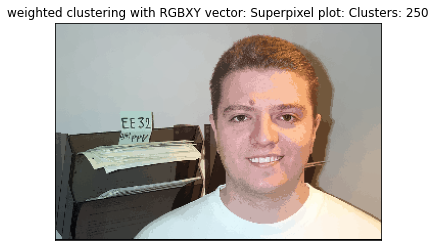

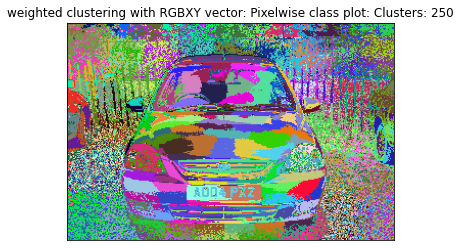

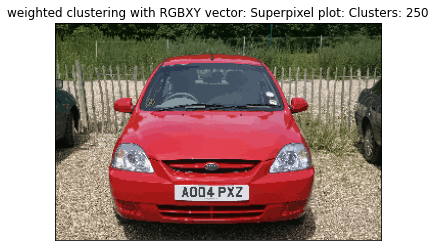

In [20]:
#TODO: clustering r,b,g,x,y values with lambdas and display outputs
def cluster_rgbxy_with_weights(im,k, lambda_1, lambda_2):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    #assert 1==2,"NOT IMPLEMENTED"
    segmap = kmeans(im, k, clr_wt=lambda_1, pos_wt=lambda_2)
    return segmap


for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  k = 250
  clusters = cluster_rgbxy_with_weights(im, k=250, lambda_1=20, lambda_2=10)
  _ = rgb_segment(clusters,n = k, title =  "weighted clustering with RGBXY vector: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "weighted clustering with RGBXY vector: Superpixel plot: Clusters: "+ str(k))
  print('Clustering done for image:', i+1)


===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
===========<< Clusters:  250 : Iteration:  5  complete >>===========
===========<< Clusters:  250 : Iteration:  6  complete >>===========
===========<< Clusters:  250 : Iteration:  7  complete >>===========
===========<< Clusters:  250 : Iteration:  8  complete >>===========
===========<< Clusters:  250 : Iteration:  9  complete >>===========
===========<< Clusters:  250 : Iteration:  10  complete >>===========
Clustering done for image: 1
===========<< Clusters:  250 : Iteration:  1  complete >>===========
===========<< Clusters:  250 : Iteration:  2  complete >>===========
===========<< Clusters:  250 : Iteration:  3  complete >>===========
===========<< Clusters:  250 : Iteration:  4  complete >>===========
====

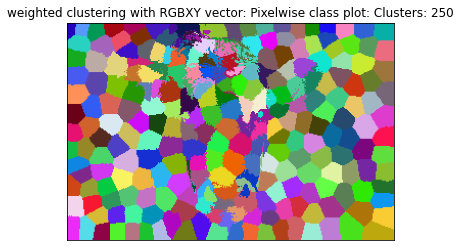

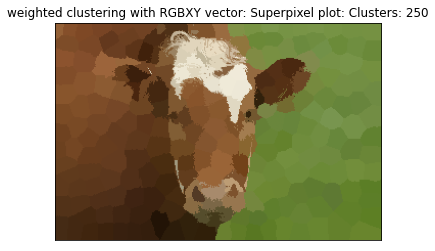

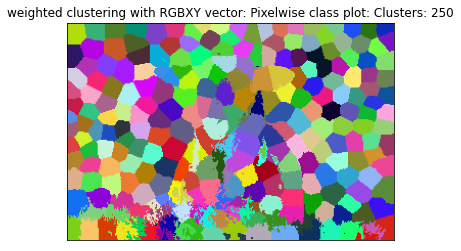

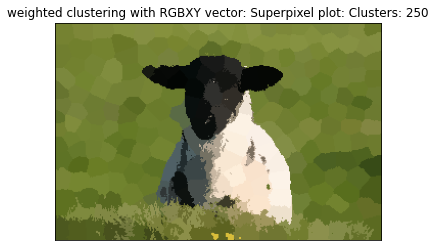

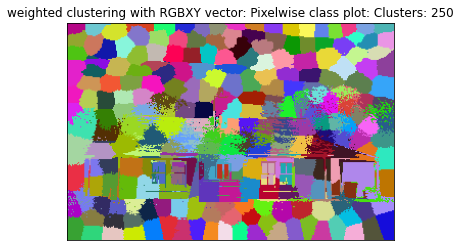

...

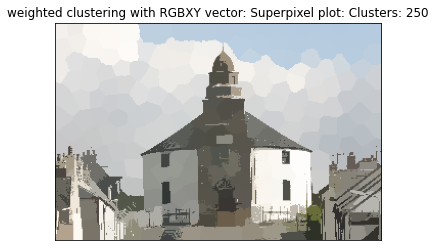

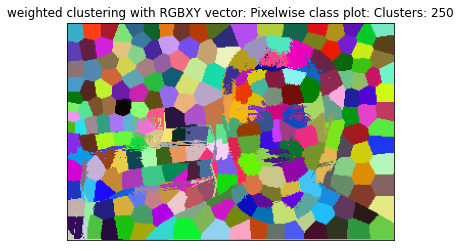

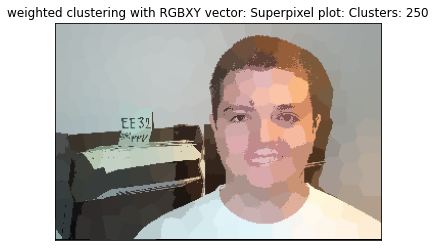

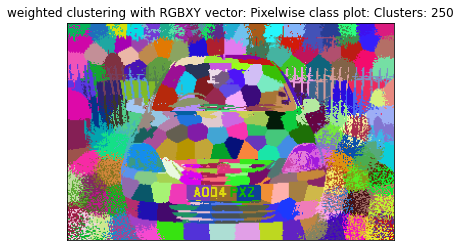

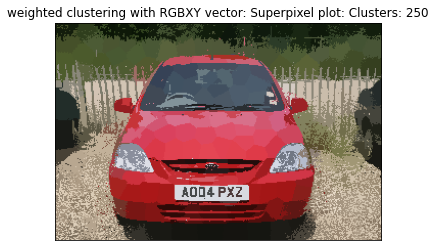

In [21]:
##Testing with large value of lambda2 (ie weight of xy distance), we can see that it has ignored the color space and clustering has been done just based on proximity
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  k = 250
  clusters = cluster_rgbxy_with_weights(im, k=250, lambda_1=2, lambda_2=50)
  _ = rgb_segment(clusters,n = k, title =  "weighted clustering with RGBXY vector: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "weighted clustering with RGBXY vector: Superpixel plot: Clusters: "+ str(k))
  print('Clustering done for image:', i+1)

###Câu hỏi 3: SLIC

Có vẻ như chúng ta không có một kết quả thuận lợi nào với các siêu pixel chỉ đơn giản được triển khai dưới dạng K-mean. Chúng ta có thể làm tốt hơn không? Hãy xem bài báo SLIC [tại đây](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Kết hợp S và m và xác định lại số liệu khoảng cách của bạn theo bài báo.


__Chúng tôi đang tính đến việc chuẩn hóa khoảng cách không gian trong hình ảnh vì nó phụ thuộc vào kích thước hình ảnh để không bỏ qua khoảng cách trong không gian màu (có giới hạn)__

__Chúng tôi có thể làm cho các phân đoạn nhỏ gọn và đều đặn hơn với số lượng hoặc pixel gần như bằng nhau trong mỗi cụm.__

In [22]:
def rgb_to_lab(img):
    img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB).astype(np.float64)
    return img_lab


def get_ind_pos_map(height, width):
    ind_pos_map = []
    for i in range(height):
        pos_list = []
        for j in range(width):
            pos_list.append([i,j])
        ind_pos_map.append(pos_list)
    return np.array(ind_pos_map)

In [23]:
def init_clusters(im, height, width, k, S):
    cluster_list = []
    
    for i in range(S//2, height, S):
        for j in range(S//2, width, S):
            pixel_clr = im[i,j]
            cluster = Cluster(pixel_clr, np.array([i,j]))
            
            ## we can adjust the cluster center in this loop only:
            ## adjust the cluster centers to min local gradient
            align_to_min_local_gradient(im, height, width, cluster)
            
            cluster_list.append(cluster)
            
    return cluster_list

In [24]:
def align_to_min_local_gradient(im, height, width, cluster):
    pos_y, pos_x = cluster.xy_center
    color_val = cluster.color_center
    
    min_grad = math.inf
    for i in range(pos_y-1, pos_y+2):
        for j in range(pos_x-1, pos_x+2):
            
            i, j = validate_point(height, width, i, j)
                
            gradient = get_gradient(im, j, i)
            
            if gradient < min_grad:
                min_grad = gradient
                cluster.xy_center = np.array([i, j])
                cluster.color_center = im[i, j]


def validate_point(height, width, y, x):
    if y < 0:
        y = 0 
    elif y >= height:
        y = height - 1
    if x < 0:
        x = 0 
    elif x >= width:
        x = width - 1
    
    return y, x
            
def get_gradient(im, x, y):
    vec1 = im[y+1, x] - im[y-1, x]
    vec2 = im[y, x+1] - im[y, x-1]
    gradient = (np.linalg.norm(vec1)**2 + np.linalg.norm(vec2)**2)
    return gradient

In [25]:
def assign_pixels_to_clusters(im, height, width, clusters, m, S, distance_map, seg_map):
    for c_ind, cluster in enumerate(clusters):
        pos_y, pos_x = cluster.xy_center
        pos_y, pos_x = int(pos_y), int(pos_x)
        for i in range(pos_y-S, pos_y+S):
            for j in range(pos_x-S, pos_x+S):
                
                i, j = validate_point(height, width, i, j)
                
                pixel_color = im[i,j]
                curr_pixel = Pixel(pixel_color, np.array([i,j]))

                centroid_pix = Pixel(cluster.color_center, cluster.xy_center)
                dist = weighted_distance(curr_pixel, centroid_pix, clr_wt=(1/S)**2, pos_wt=(1/m)**2)

                if dist < distance_map[i,j]:
                    distance_map[i,j] = dist
                    seg_map[i,j] = c_ind + 1


def adjust_cluster_centers(im, clusters, seg_map, ind_pos_map):
    for c_ind, cluster in enumerate(clusters):
        match_idx = (seg_map == (c_ind+1))
        
        pixels_in_cluster_lab = im[match_idx]
        pixels_in_cluster_yx = ind_pos_map[match_idx]
        
        color_mean = pixels_in_cluster_lab.mean(axis=0)
        pos_mean = pixels_in_cluster_yx.mean(axis=0)
        
        cluster.color_center = color_mean
        cluster.xy_center = pos_mean

In [26]:
def is_valid_point(ht, wd, pt):
    y, x = pt
    return (0 <= y < ht) and (0 <= x < wd)

def get_nearest_label(height, width, pix_pos, adj_shift, new_seg_map, nearest_label):
    #check for a labelled pixel to assign if the superpixel size < min_area
    for shift in adj_shift:
        neighbor_pix = tuple(np.array(pix_pos) + shift)
        if is_valid_point(height, width, neighbor_pix):
            if new_seg_map[neighbor_pix] >=0:
                nearest_label = new_seg_map[neighbor_pix]
                break
    return nearest_label

#### Mã để thực thi kết nối sau khi nhận được siêu pixel.
Thực thi kết nối: Có nhiều siêu pixel rất nhỏ và không liên kết với nhau. Chúng ta cần hợp nhất chúng với các siêu pixel lớn hơn.
Chúng tôi đang dán nhãn lại các pixel trong chức năng này.
- một bản đồ phân đoạn mới được xác định.
- Thuật toán BFS được sử dụng để tìm một nhóm các nhãn giống nhau.
- Nếu số pixel trong một nhóm nhỏ hơn giới hạn thì nhãn lân cận sẽ được gán cho tất cả các pixel đó.



In [27]:
'''
We are re-labeling the pixels in this function.
1) a new segement map is defined
2) BFS algo is used to find a group of same labels
3) If the number of pixels in a group is less than the limit than a nearby label is assigned to all those pixels

'''

def enforce_connectivity(height, width, seg_map, min_area):
    new_seg_map = -1*np.ones((height,width))
    
    new_cluster_id = 0  # for the new_seg_map
    nearest_label = 0
    
    adj_shift = np.array([[0,1],[0,-1],[1,0],[-1,0]])    
    
    pix_cluster = []
    min_area = int(min_area)
    for i in range(height):
        for j in range(width):
            pix_curr_label = seg_map[i, j]
            
            # find a pixel yet not labelled in the new seg map
            if new_seg_map[i, j] == -1:
                
                #start checking for same neighbouring pixel labels - simple BFS
                
                pix_cluster = []
                pix_cluster.append((i, j))
                visited_pix = set()
                
                
                while len(pix_cluster) != 0:
                    pix = pix_cluster.pop(0)
                    visited_pix.add(pix)
                    for shift in adj_shift:
                        neighbor_pix = tuple(np.array(pix) + shift)
                        if is_valid_point(height, width, neighbor_pix):
                            
                            # if adj pixel is unlabelled then label it:
                            if (new_seg_map[neighbor_pix] == -1 and (seg_map[neighbor_pix] == pix_curr_label)):
                                pix_cluster.append(neighbor_pix)
                                new_seg_map[neighbor_pix] = new_cluster_id
                                
                curr_area = len(visited_pix)              
                # re-label if the curr_area (i.e the number of pixels in the cluster) is less than the min_area:
                if curr_area < min_area >> 2:
                    nearest_label = get_nearest_label(height, width, (i, j), adj_shift, new_seg_map, nearest_label)
                    for pix in visited_pix:
                        new_seg_map[pix] = nearest_label
    
                else:
                    new_cluster_id += 1
                
    return new_seg_map

In [28]:
def slic_seg(im_rgb, k, is_enforce_connectivity, m=10, num_iter=10):
    
    im = rgb_to_lab(im_rgb)
    MAX_NUM = math.inf
    height, width = im.shape[0], im.shape[1]
    
    seg_map = -1 * np.ones((height, width))
    distance_map =  MAX_NUM * np.ones((height, width))
    ind_pos_map = get_ind_pos_map(height, width)
    
    N = im.shape[0]*im.shape[1]  # total_num_pixels
    area_super_pixel = N/k
    S = int(math.sqrt(area_super_pixel))
    
    clusters = init_clusters(im, height, width, k, S)
    
    itr = 0
    while itr < num_iter:
        assign_pixels_to_clusters(im, height, width, clusters, m, S, distance_map, seg_map)
        
        adjust_cluster_centers(im, clusters, seg_map, ind_pos_map)
        
        itr += 1
        print('===========<< Clusters: ', k, ': Iteration: ', itr, ' complete >>===========')
        
        # repeat
    if is_enforce_connectivity:
      print('Enforcinng Connectivity')
      seg_map = enforce_connectivity(height, width, seg_map, area_super_pixel)
    
    return seg_map

In [29]:
############ Algorithm ############
# Compute grid steps: S
# explore different values of m
# initialize cluster centers [l,a,b,x,y] using  
# Perturb for minimum G
# while not converged
# for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S. 
####  Assign to nearest cluster
##calculate new cluster center 
 

def SLIC(im, k, is_enforce_connectivity):
    """
    Input arguments: 
    im: image input
    k: number of cluster segments


    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..
    
    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """
    segmap = slic_seg(im, k, is_enforce_connectivity, m=10, num_iter=10)
    return segmap

===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
===========<< Clusters:  100 : Iteration:  4  complete >>===========
===========<< Clusters:  100 : Iteration:  5  complete >>===========
===========<< Clusters:  100 : Iteration:  6  complete >>===========
===========<< Clusters:  100 : Iteration:  7  complete >>===========
===========<< Clusters:  100 : Iteration:  8  complete >>===========
===========<< Clusters:  100 : Iteration:  9  complete >>===========
===========<< Clusters:  100 : Iteration:  10  complete >>===========
Superpixel Clustering done for image without enforcing connectivity:  1
===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
===========<< Clusters:  100 :

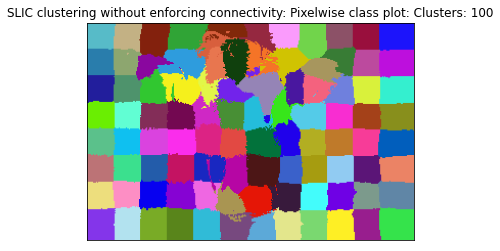

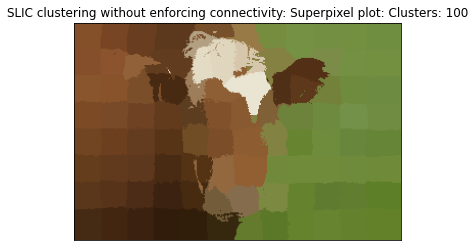

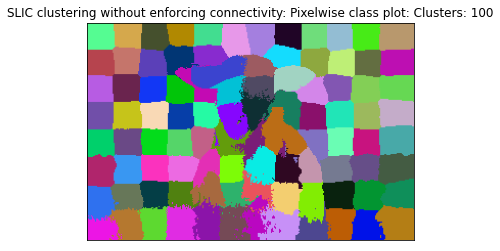

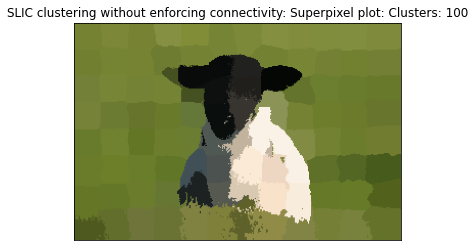

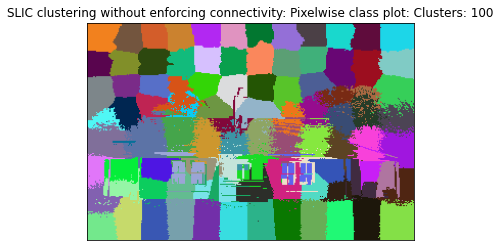

...

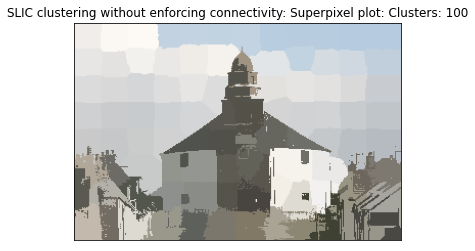

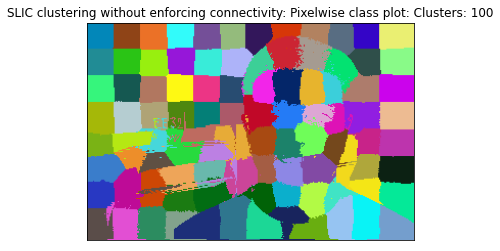

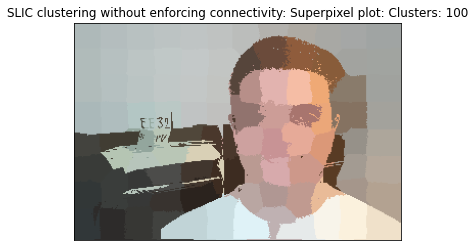

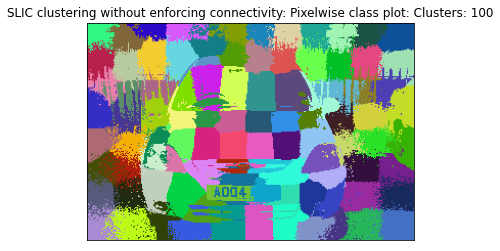

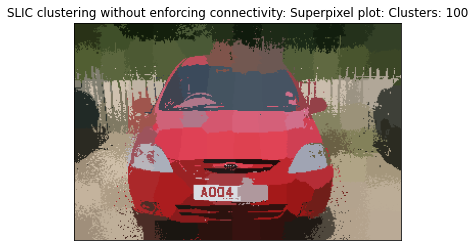

In [30]:

k=100
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  clusters = SLIC(im, k, False)  # is_enforce_connectivity=False
  _ = rgb_segment(clusters,n = k, title =  "SLIC clustering without enforcing connectivity: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "SLIC clustering without enforcing connectivity: Superpixel plot: Clusters: "+ str(k))
  print('Superpixel Clustering done for image without enforcing connectivity: ', i+1)

## Thực thi kết nối:
Thực thi kết nối: Có nhiều siêu pixel rất nhỏ và không liên kết với nhau. Cố gắng hợp nhất chúng với các siêu pixel lớn hơn

Thuật toán O(N):
1. Đặt kích thước siêu pixel tối thiểu
2. Nếu diện tích của một vùng nhỏ hơn ngưỡng, chúng tôi sẽ gán vùng đó cho cụm gần nhất


===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
===========<< Clusters:  100 : Iteration:  4  complete >>===========
===========<< Clusters:  100 : Iteration:  5  complete >>===========
===========<< Clusters:  100 : Iteration:  6  complete >>===========
===========<< Clusters:  100 : Iteration:  7  complete >>===========
===========<< Clusters:  100 : Iteration:  8  complete >>===========
===========<< Clusters:  100 : Iteration:  9  complete >>===========
===========<< Clusters:  100 : Iteration:  10  complete >>===========
Enforcinng Connectivity
Superpixel Clustering done for image with enforcing connectivity:  1
===========<< Clusters:  100 : Iteration:  1  complete >>===========
===========<< Clusters:  100 : Iteration:  2  complete >>===========
===========<< Clusters:  100 : Iteration:  3  complete >>===========
=========

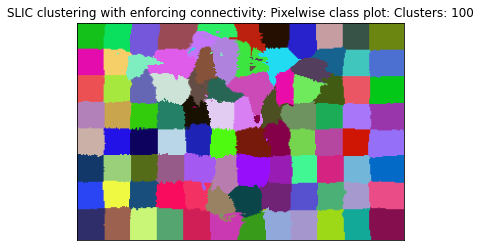

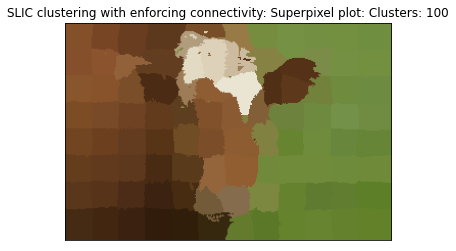

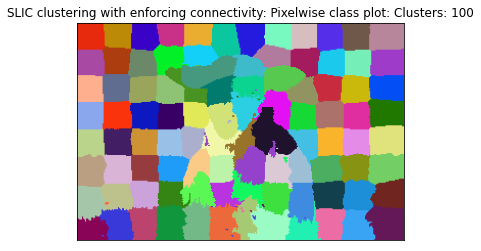

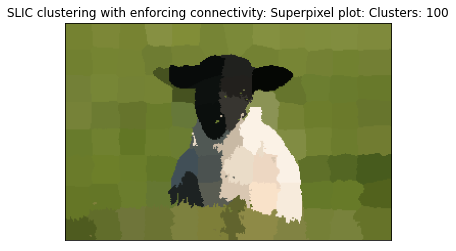

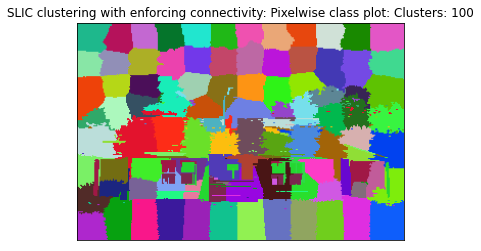

...

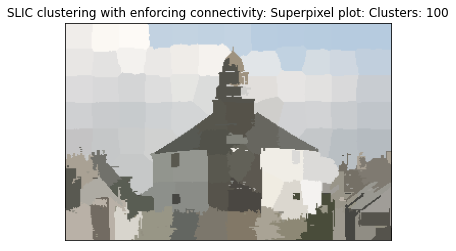

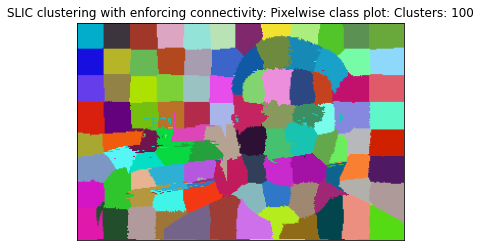

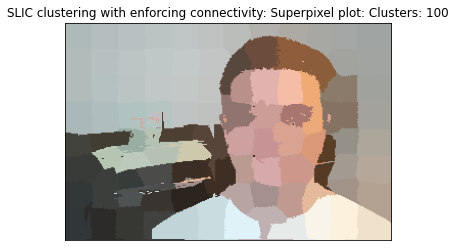

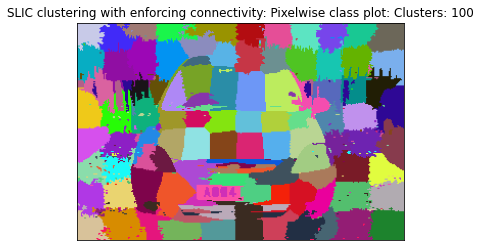

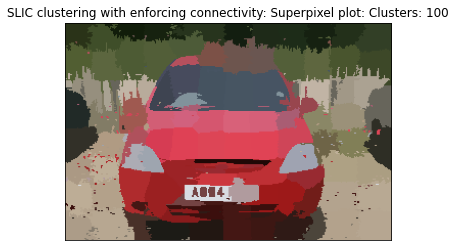

In [31]:
k=100
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  clusters = SLIC(im, k, True)  # is_enforce_connectivity=True
  _ = rgb_segment(clusters,n = k, title =  "SLIC clustering with enforcing connectivity: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "SLIC clustering with enforcing connectivity: Superpixel plot: Clusters: "+ str(k))
  print('Superpixel Clustering done for image with enforcing connectivity: ', i+1)
  

In [34]:
#TODO diplay your SLIC results

##THUẬT TOÁN SLIC CHẠY BẰNG THƯ VIỆN 


# So sánh các thuật toán phân đoạn và siêu pixel

Ví dụ này so sánh bốn phương pháp phân đoạn hình ảnh mức thấp phổ biến. Vì rất khó để có được các phân đoạn tốt và định nghĩa "tốt" thường phụ thuộc vào ứng dụng, các phương pháp này thường được sử dụng để có được một phân đoạn quá mức, còn được gọi là siêu pixel. Sau đó, các siêu pixel này sẽ làm cơ sở cho các thuật toán phức tạp hơn, chẳng hạn như trường ngẫu nhiên có điều kiện (CRF).


## Phân đoạn dựa trên biểu đồ hiệu quả của Felzenszwalb
Thuật toán phân đoạn hình ảnh 2D nhanh này, được đề xuất trong [1]_, phổ biến trong cộng đồng thị giác máy tính. Thuật toán có một tham số ``tỷ lệ`` duy nhất ảnh hưởng đến kích thước phân khúc. Kích thước và số lượng phân đoạn thực tế có thể khác nhau rất nhiều, tùy thuộc vào độ tương phản cục bộ.

.. [1] Phân đoạn hình ảnh dựa trên biểu đồ hiệu quả, Felzenszwalb, P.F. và Huttenlocher, D.P. Tạp chí Quốc tế về Tầm nhìn Máy tính, 2004


## Phân đoạn hình ảnh Quickshift

Quickshift là một thuật toán phân đoạn hình ảnh 2D tương đối gần đây, dựa trên phép tính gần đúng của dịch chuyển trung bình được nhân hóa. Do đó, nó thuộc họ thuật toán tìm kiếm chế độ cục bộ và được áp dụng cho không gian 5D bao gồm thông tin màu sắc và vị trí ảnh [2]_.
Một trong những lợi ích của quickshift là nó thực sự tính toán một
phân đoạn theo thứ bậc trên nhiều quy mô cùng một lúc. Quickshift có hai tham số chính: ``sigma`` kiểm soát tỷ lệ xấp xỉ mật độ cục bộ, ``max_dist`` chọn một mức trong phân đoạn phân cấp được tạo. Ngoài ra còn có sự đánh đổi giữa khoảng cách trong không gian màu và khoảng cách trong không gian hình ảnh, được cho bởi ``tỷ lệ``.

.. [2] Các phương pháp nhân và dịch chuyển nhanh cho chế độ tìm kiếm Vedaldi, A. và Soatto, S. Hội nghị Châu Âu về Tầm nhìn Máy tính, 2008


## SLIC - Phân đoạn hình ảnh dựa trên K-Means

Thuật toán này chỉ đơn giản thực hiện K-mean trong không gian 5d của thông tin màu và vị trí hình ảnh, do đó có liên quan chặt chẽ với sang số nhanh. Vì phương pháp phân cụm đơn giản hơn nên nó rất hiệu quả. Điều cần thiết là thuật toán này phải hoạt động trong không gian màu Lab để thu được kết quả tốt. Thuật toán nhanh chóng đạt được động lực và hiện được sử dụng rộng rãi. Xem [3] _ để biết chi tiết. Tham số ``độ nhỏ gọn`` đánh đổi độ tương tự về màu sắc và độ gần, như trong trường hợp của Quickshift, trong khi ``n_segments`` chọn số tâm cho kmean.

.. [3] Radhakrishna Achanta, Appu Shaji, Kevin Smith, Aurelien Lucchi,
     Pascal Fua và Sabine Suesstrunk, Siêu pixel SLIC được so sánh với
     Phương pháp Superpixel tiên tiến nhất, TPAMI, tháng 5 năm 2012.


## Phân vùng đầu nguồn nhỏ gọn của hình ảnh gradient

Thay vì lấy hình ảnh màu làm đầu vào, lưu vực đầu nguồn yêu cầu hình ảnh *độ dốc* thang độ xám, trong đó các pixel sáng biểu thị ranh giới giữa các vùng. Thuật toán xem hình ảnh dưới dạng phong cảnh, với các pixel sáng tạo thành các đỉnh cao. Cảnh quan này sau đó bị ngập từ *điểm đánh dấu* nhất định, cho đến khi các lưu vực lũ riêng biệt gặp nhau tại các đỉnh. Mỗi lưu vực riêng biệt sau đó tạo thành một phân đoạn hình ảnh khác nhau. [4]_
Như với SLIC, có một đối số *compactness* bổ sung làm cho điểm đánh dấu khó tràn ngập các pixel ở xa hơn. Điều này làm cho các vùng đầu nguồn có hình dạng đều đặn hơn. [5]_

.. [4] https://en.wikipedia.org/wiki/Watershed_%28image_processing%29

.. [5] Peer Neubert & Peter Protzel (2014). Đầu nguồn nhỏ gọn và SLIC ưu tiên: Về việc cải thiện sự đánh đổi của các thuật toán phân đoạn siêu pixel. ICPR 2014, trang 996-1001. :DOI:`10.1109/ICPR.2014.181`
https://www.tuchemnitz.de/etit/proaut/publications/cws_pSLIC_ICPR.pdf

In [35]:
%matplotlib inline

Felzenszwalb number of segments: 194
SLIC number of segments: 196
Quickshift number of segments: 695
Watershed number of segments: 256


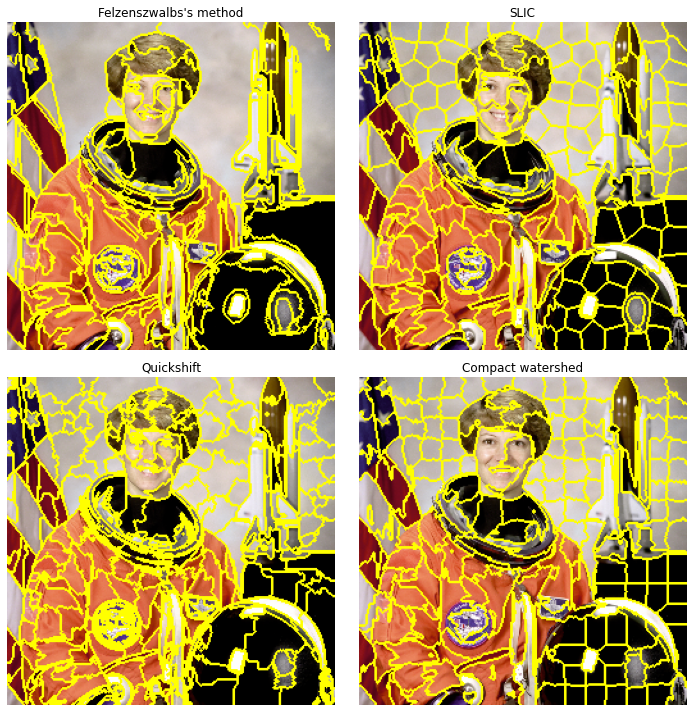

In [36]:
import matplotlib.pyplot as plt
import numpy as np

from skimage.data import astronaut
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float

img = img_as_float(astronaut()[::2, ::2])

segments_fz = felzenszwalb(img, scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img, n_segments=250, compactness=10, sigma=1,
                     start_label=1)
segments_quick = quickshift(img, kernel_size=3, max_dist=6, ratio=0.5)
gradient = sobel(rgb2gray(img))
segments_watershed = watershed(gradient, markers=250, compactness=0.001)

print(f'Felzenszwalb number of segments: {len(np.unique(segments_fz))}')
print(f'SLIC number of segments: {len(np.unique(segments_slic))}')
print(f'Quickshift number of segments: {len(np.unique(segments_quick))}')
print(f'Watershed number of segments: {len(np.unique(segments_watershed))}')

fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)

ax[0, 0].imshow(mark_boundaries(img, segments_fz))
ax[0, 0].set_title("Felzenszwalbs's method")
ax[0, 1].imshow(mark_boundaries(img, segments_slic))
ax[0, 1].set_title('SLIC')
ax[1, 0].imshow(mark_boundaries(img, segments_quick))
ax[1, 0].set_title('Quickshift')
ax[1, 1].imshow(mark_boundaries(img, segments_watershed))
ax[1, 1].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()